<a href="https://colab.research.google.com/github/kamrulkonok/UPC_ML_Project/blob/Konok/EDA%2BData_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import pearsonr
import plotly.graph_objects as go
from shapely.geometry import Point
import geopandas as gpd
import contextily as ctx

In [14]:
df = pd.read_csv("/content/drive/MyDrive/ML Project/dataset/airbnb_data.csv")
df.head()

,Unnamed: 0,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,...,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
0,0,194.033698,Private room,False,True,2.0,False,1,0,10.0,...,5.022964,2.539380,78.690379,4.166708,98.253896,6.846473,4.90569,52.41772,amsterdam,weekdays
1,1,344.245776,Private room,False,True,4.0,False,0,0,8.0,...,0.488389,0.239404,631.176378,33.421209,837.280757,58.342928,4.90005,52.37432,amsterdam,weekdays
2,2,264.101422,Private room,False,True,2.0,False,0,1,9.0,...,5.748312,3.651621,75.275877,3.985908,95.386955,6.646700,4.97512,52.36103,amsterdam,weekdays
3,3,433.529398,Private room,False,True,4.0,False,0,1,9.0,...,0.384862,0.439876,493.272534,26.119108,875.033098,60.973565,4.89417,52.37663,amsterdam,weekdays
4,4,485.552926,Private room,False,True,2.0,True,0,0,10.0,...,0.544738,0.318693,552.830324,29.272733,815.305740,56.811677,4.90051,52.37508,amsterdam,weekdays


The dataset does not contain any null values

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51707 entries, 0 to 51706
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  51707 non-null  int64  
 1   realSum                     51707 non-null  float64
 2   room_type                   51707 non-null  object 
 3   room_shared                 51707 non-null  bool   
 4   room_private                51707 non-null  bool   
 5   person_capacity             51707 non-null  float64
 6   host_is_superhost           51707 non-null  bool   
 7   multi                       51707 non-null  int64  
 8   biz                         51707 non-null  int64  
 9   cleanliness_rating          51707 non-null  float64
 10  guest_satisfaction_overall  51707 non-null  float64
 11  bedrooms                    51707 non-null  int64  
 12  dist                        51707 non-null  float64
 13  metro_dist                  517

The dataset does not contain any duplicate values

In [ ]:
df.duplicated().sum()

0

The max value of 'real_sum' indicates there are possibilities of outliers.



In [ ]:
df.describe(include = 'all')

,Unnamed: 0,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,...,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
count,51707.000000,51707.000000,51707,51707,51707,51707.000000,51707,51707.000000,51707.000000,51707.000000,...,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707,51707
unique,NaN,NaN,3,2,2,NaN,2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,2
top,NaN,NaN,Entire home/apt,False,False,NaN,False,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,london,weekends
freq,NaN,NaN,32648,51341,33014,NaN,38475,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9993,26207
mean,1620.502388,279.879591,NaN,NaN,NaN,3.161661,NaN,0.291353,0.350204,9.390624,...,3.191285,0.681540,294.204105,13.423792,626.856696,22.786177,7.426068,45.671128,NaN,NaN
std,1217.380366,327.948386,NaN,NaN,NaN,1.298545,NaN,0.454390,0.477038,0.954868,...,2.393803,0.858023,224.754123,9.807985,497.920226,17.804096,9.799725,5.249263,NaN,NaN
min,0.000000,34.779339,NaN,NaN,NaN,2.000000,NaN,0.000000,0.000000,2.000000,...,0.015045,0.002301,15.152201,0.926301,19.576924,0.592757,-9.226340,37.953000,NaN,NaN
25%,646.000000,148.752174,NaN,NaN,NaN,2.000000,NaN,0.000000,0.000000,9.000000,...,1.453142,0.248480,136.797385,6.380926,250.854114,8.751480,-0.072500,41.399510,NaN,NaN
50%,1334.000000,211.343089,NaN,NaN,NaN,3.000000,NaN,0.000000,0.000000,10.000000,...,2.613538,0.413269,234.331748,11.468305,522.052783,17.542238,4.873000,47.506690,NaN,NaN
75%,2382.000000,319.694287,NaN,NaN,NaN,4.000000,NaN,1.000000,1.000000,10.000000,...,4.263077,0.737840,385.756381,17.415082,832.628988,32.964603,13.518825,51.471885,NaN,NaN


# Plotting histogram for numerical features

On the one hand, The `realSum` has a right-skewed distribution, indicating majority of prices are at the lower end with few high outliers. `person_capacity` shows higher count at 2, 3, and 4, this suggest the most common capacities. Higher distribution of `cleaniness_rating` and `guest_satisfaction_overall` indicates most of the guests are satified with the cleaniness of the house and overall.

On the other hand, most other columns have distributions centered around their mean values.

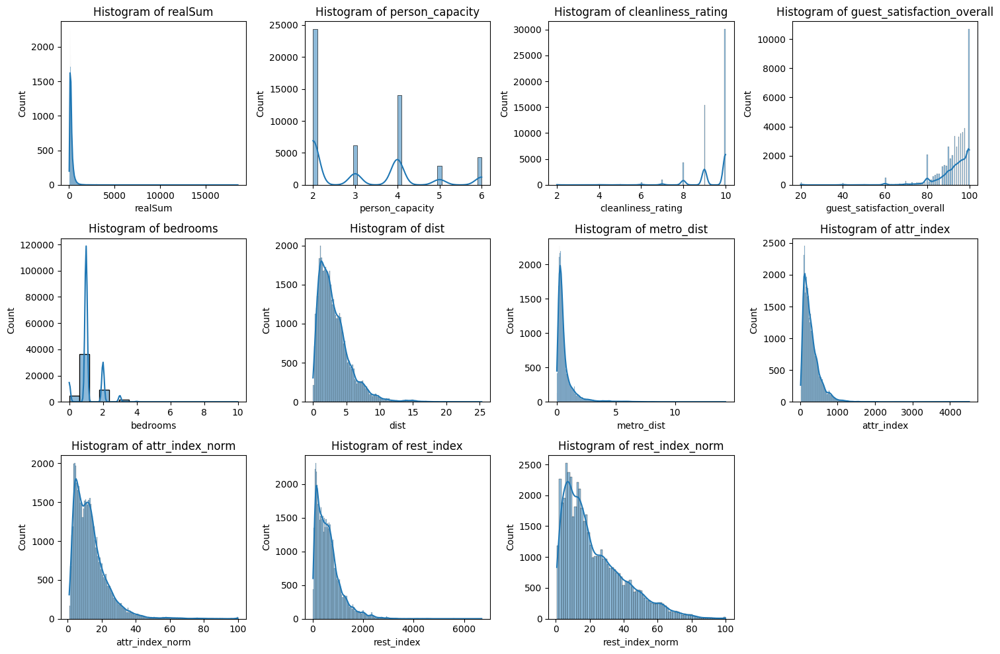

In [ ]:
plt.figure(figsize=(15, 10))

# List of numerical columns to plot
numerical_columns = ["realSum", "person_capacity", "cleanliness_rating",
                     "guest_satisfaction_overall", "bedrooms", "dist",
                     "metro_dist", "attr_index", "attr_index_norm",
                     "rest_index", "rest_index_norm"]

for i, column in enumerate(numerical_columns, start=1):
    plt.subplot(3, 4, i)
    sns.histplot(df[column], kde=True)
    plt.title(f"Histogram of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")

plt.tight_layout()
plt.show()

# Bar Plots for Categorical columns

The bar plots illustrate the frequency of each category for categorical columns. For example, room_type shows that "Private room" is the most common type, followed by "Entire home/apt." `host_is_superhost` shows a larger count of non-superhosts, indicating that superhosts are a smaller subset. The `city` plot reveals which cities have more listings in the dataset, while `day_type` indicates more listings on weekdays than weekends.

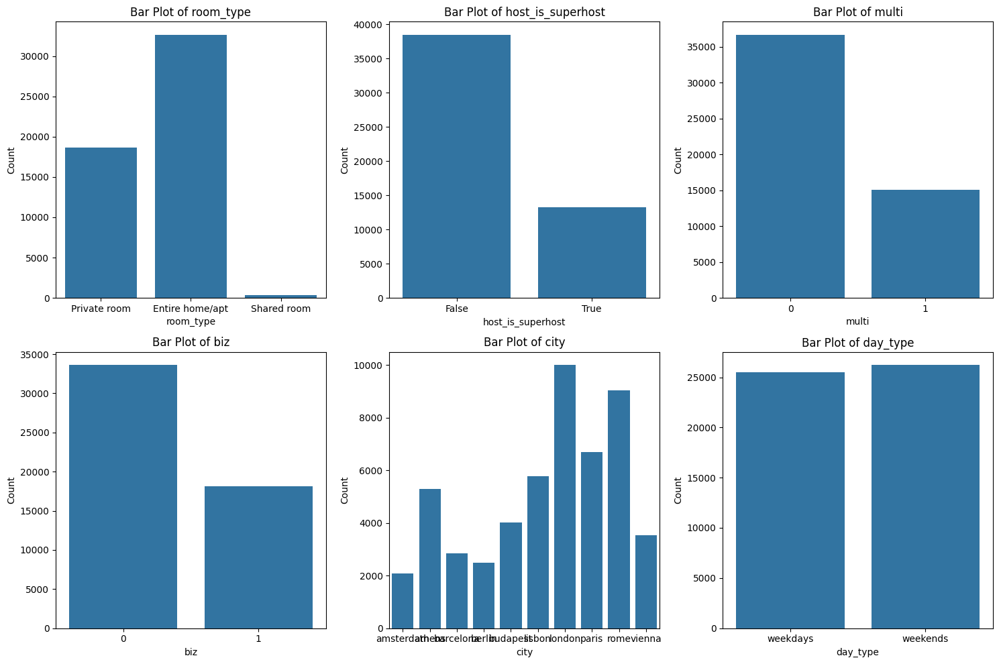

In [ ]:
#List of categorical columns
categorical_columns = ["room_type", "host_is_superhost", "multi", "biz", "city", "day_type"]

plt.figure(figsize=(15, 10))

for i, column in enumerate(categorical_columns, start=1):
    plt.subplot(2, 3, i)
    sns.countplot(x=df[column])
    plt.title(f"Bar Plot of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")

plt.tight_layout()
plt.show()

# Plotting a bar chart to compare prices in weekends and weekdays by city

It is clear from the bar chart that the average prices in every cities is compartively higher on weekends except "Athens and Paris".

In [24]:
price_comparison = df.groupby(["city", "day_type"])["realSum"].mean().reset_index()

# Plot a bar chart to compare prices in weekdays and weekends by city
fig = px.bar(price_comparison,
             x="city",
             y="realSum",
             color="day_type",
             barmode="group",
             labels={"realSum": "Average Price (EUR)", "day_type": "Day Type"},
             title="Comparison of Prices in Weekdays and Weekends by City",
             text="realSum")

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')

fig.show()

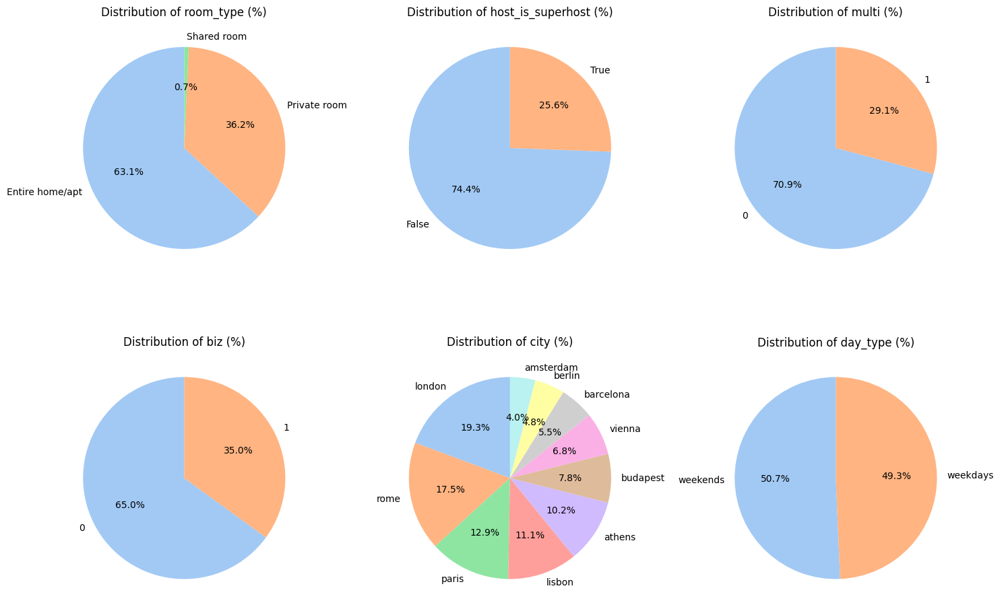

In [31]:
# List of categorical columns
categorical_columns = ["room_type", "host_is_superhost", "multi", "biz", "city", "day_type"]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for ax, column in zip(axes.flatten(), categorical_columns):

    category_distribution = df[column].value_counts(normalize=True) * 100

    ax.pie(category_distribution,
           labels=category_distribution.index,
           autopct='%1.1f%%',
           startangle=90,
           colors=sns.color_palette("pastel"))

    ax.set_title(f"Distribution of {column} (%)")

plt.tight_layout()
plt.show()



The bar chart below shows the distribution of Airbnb listings across different cities, along with the percentage of superhosts in each city. It reveals that cities like London and Rome have significantly more listings compared to smaller cities like Amsterdam and Berlin. Rome and Athens lead with the highest proportion of superhosts, while Paris and London have only about 15% superhosts.

Airbnb defines a superhost as "the top-rated, most experienced host on Airbnb, committed to providing you with outstanding hospitality." To achieve this status, hosts must meet specific criteria set by Airbnb.

In [28]:
# Group by city and count the number of listings
listings_per_city = df.groupby("city")["Unnamed: 0"].count().reset_index()
listings_per_city.columns = ["city", "listings_count"]

# Group by city and calculate the percentage of superhosts
superhost_per_city = df.groupby("city")["host_is_superhost"].mean().reset_index()
superhost_per_city["superhost_percentage"] = superhost_per_city["host_is_superhost"] * 100

city_listing_superhost = listings_per_city.merge(superhost_per_city, on="city")

fig = px.bar(city_listing_superhost,
             x="city",
             y="listings_count",
             text="superhost_percentage",
             labels={"listings_count": "Total Listings", "city": "City"},
             title="Distribution of Listings Per City and Superhost Percentage",
             hover_data=["superhost_percentage"])

fig.update_traces(texttemplate='Superhosts: %{text:.1f}%', textposition='outside')

fig.show()


# Room types analysis by cities

[Text(-15.027777777777784, 0.5, 'City'), (0.0, 1.0)]

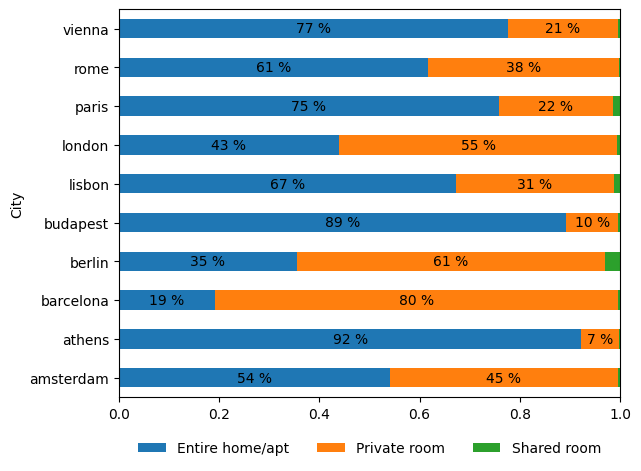

In [4]:
city_roomtype = df.groupby("city")["room_type"].value_counts(normalize=True).unstack("room_type")
crplot = city_roomtype.plot.barh(stacked=True)

plt.legend(
        bbox_to_anchor=(0.5, -0.1),
        loc="upper center",
        borderaxespad=0,
        frameon=False,
        ncol=4,)
for percentage, row in city_roomtype.reset_index(drop=True).iterrows():
    cumulative = 0
    for element in row:
        if element > 0.05:
            plt.text(
                cumulative + element / 2,
                percentage,
                f"{int(element * 100)} %",
                va="center",
                ha="center",
            )
        cumulative += element
plt.tight_layout()

crplot.set(ylabel="City", xlim=(0.0,1.0))

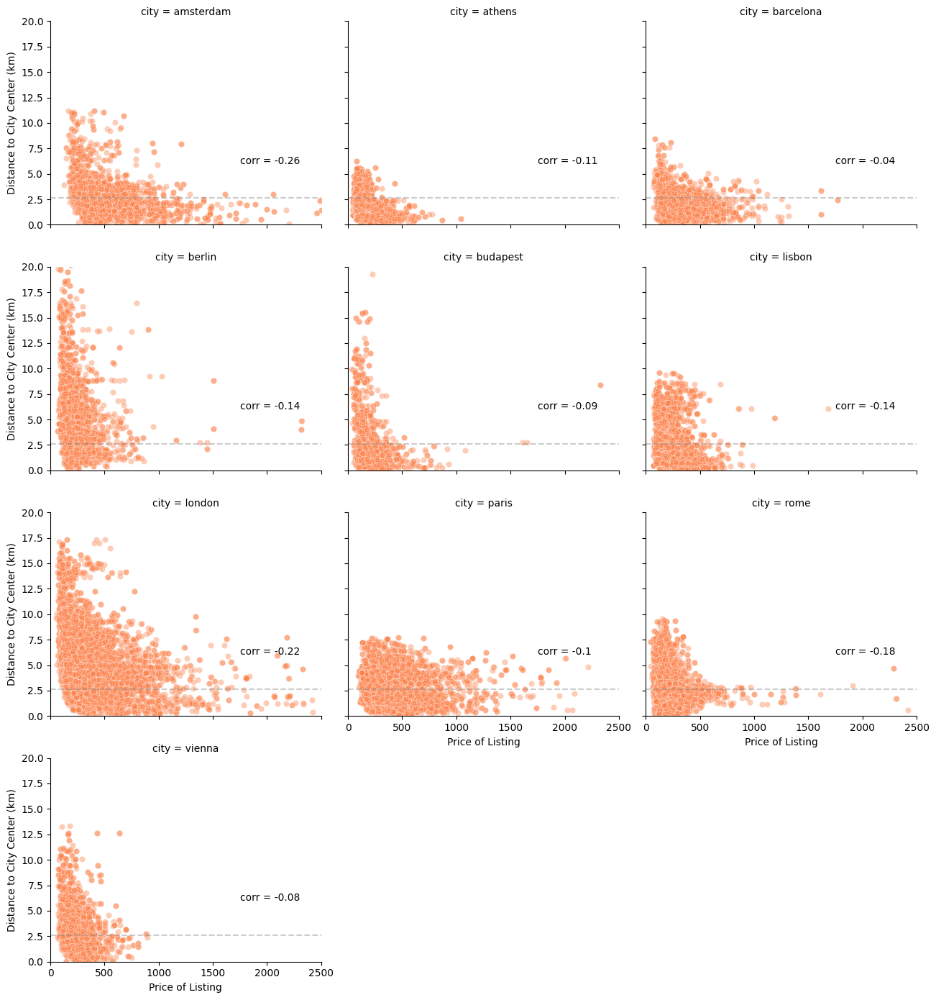

In [37]:
grid = sns.FacetGrid(df, col='city', col_wrap=3, xlim=(0, 2500), ylim=(0, 20), height=3.5, aspect=1.25)

grid.map(sns.scatterplot, "realSum", "dist", color='#FC814A', alpha=.4)

grid.refline(y=df["dist"].median(), alpha=.4)

grid.set_axis_labels("Price of Listing", "Distance to City Center (km)")

def annotate(data, **kws):
    corr, _ = pearsonr(data["realSum"], data["dist"])
    ax = plt.gca()
    ax.text(.7, .3, f"corr = {round(corr, 2)}", transform=ax.transAxes)

grid.map_dataframe(annotate)

plt.show()

Higher the prices, better rating it has

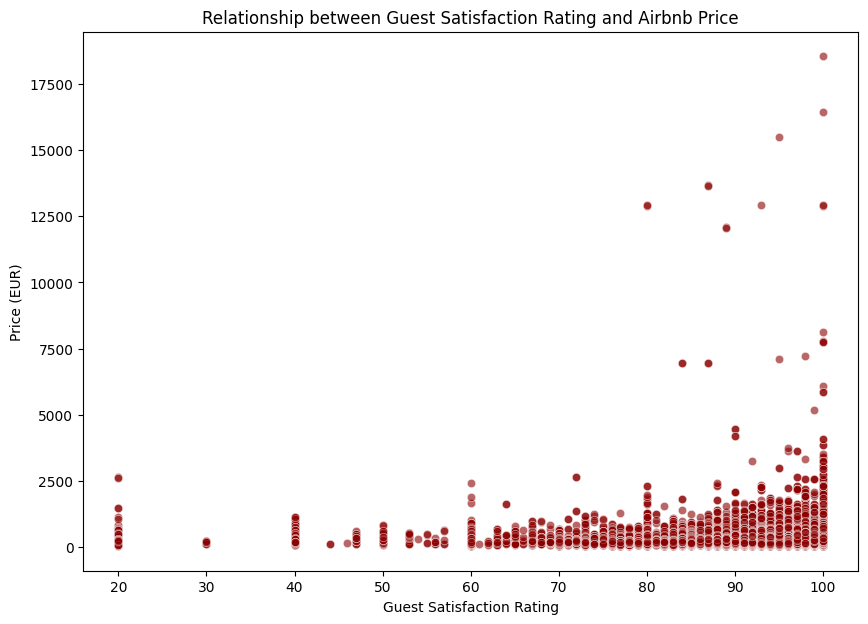

In [55]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=df["guest_satisfaction_overall"], y=df["realSum"], alpha=0.6, color='darkred')
plt.title("Relationship between Guest Satisfaction Rating and Airbnb Price")
plt.xlabel("Guest Satisfaction Rating")
plt.ylabel("Price (EUR)")
plt.show()

<ipython-input-68-35fa33f6f6c2>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




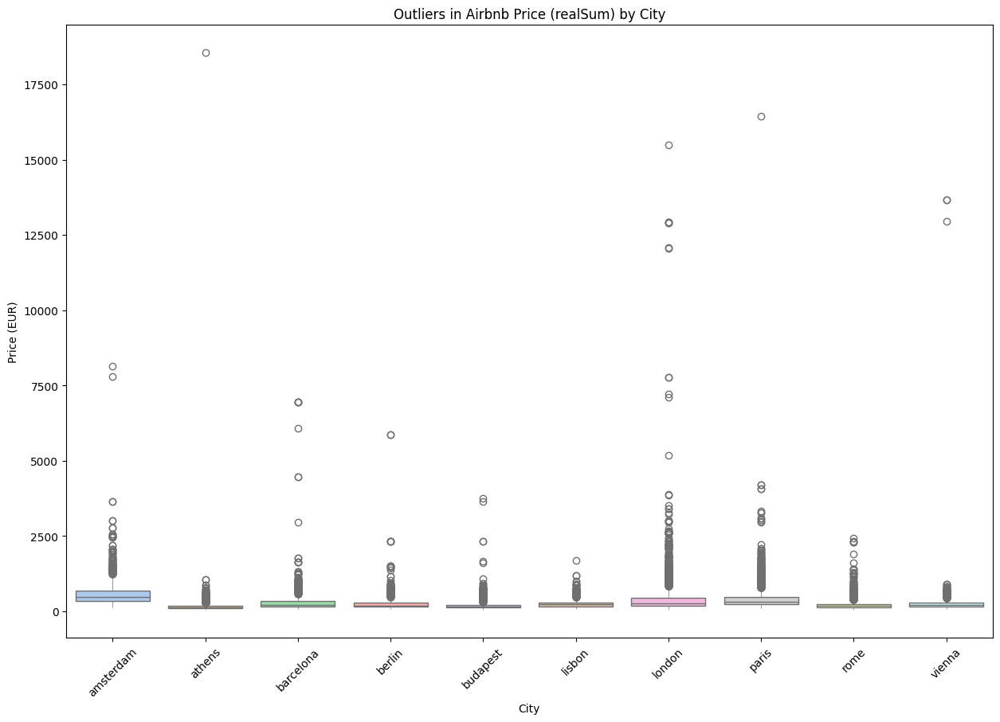

In [68]:
plt.figure(figsize=(15, 10))
sns.boxplot(x="city", y="realSum", data=df, palette="pastel", showcaps=False, whiskerprops={"linewidth": 0.5})
plt.title("Outliers in Airbnb Price (realSum) by City")
plt.xlabel("City")
plt.ylabel("Price (EUR)")
plt.xticks(rotation=45)
plt.show()

It is clear that the prices on weekdays and weekends are pretty similar, but it is interesting to see the potential outliers in both.

<ipython-input-60-5ea6de35add1>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




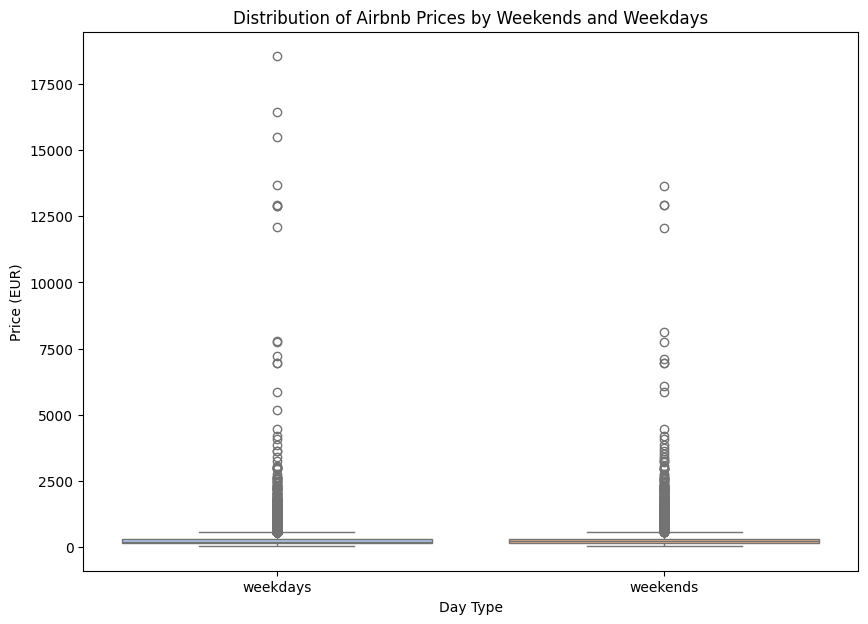

In [60]:
plt.figure(figsize=(10, 7))
sns.boxplot(x="day_type", y="realSum", data=df, palette="pastel")
plt.title("Distribution of Airbnb Prices by Weekends and Weekdays")
plt.xlabel("Day Type")
plt.ylabel("Price (EUR)")
plt.show()

# Density of Airbnb listing based on distance from each city center

Most Airbnb houses are within 10 km of city centers. In cities where population and attractions are concentrated around the city center, like Lisbon and Athens, we can find that most Airbnb listings are close to the city center. In decentralized and dispersed cities like Berlin and Amsterdam, listings are more equally spread out from the city center. In cities that have several centers like Rome and Paris, you may find more listings around these centers compared to other places.

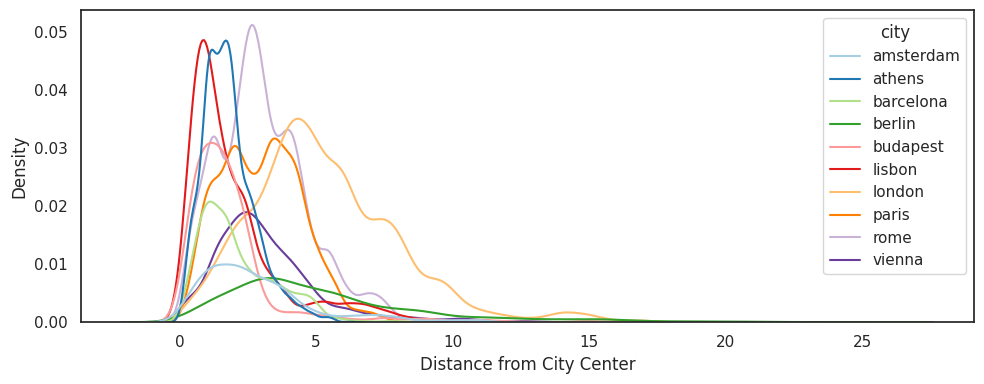

In [6]:
sns.set(style="white")
plt.figure(figsize=(10,4))
g = sns.kdeplot(data=df, x="dist", hue="city", palette="Paired")
g.set(xlabel = "Distance from City Center")

plt.tight_layout()

plt.show()

# Spatial Analysis



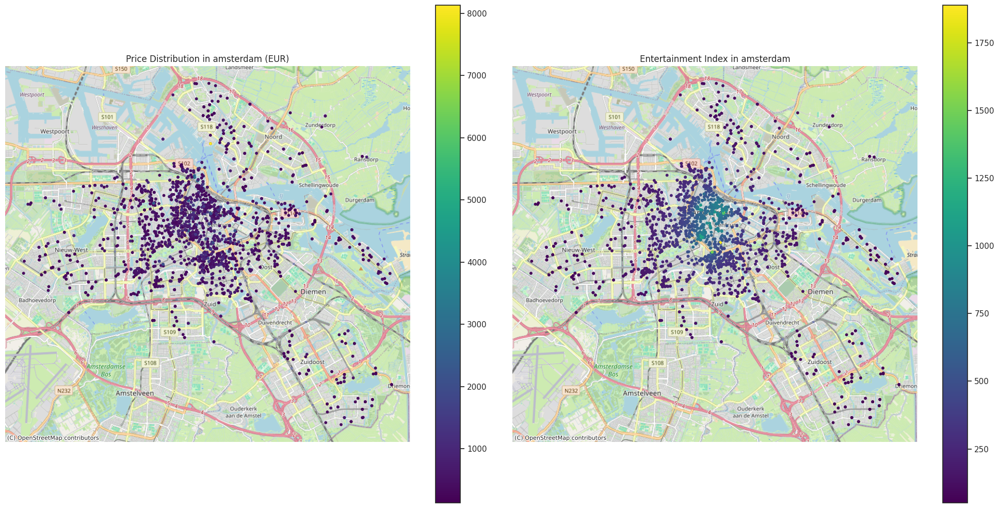

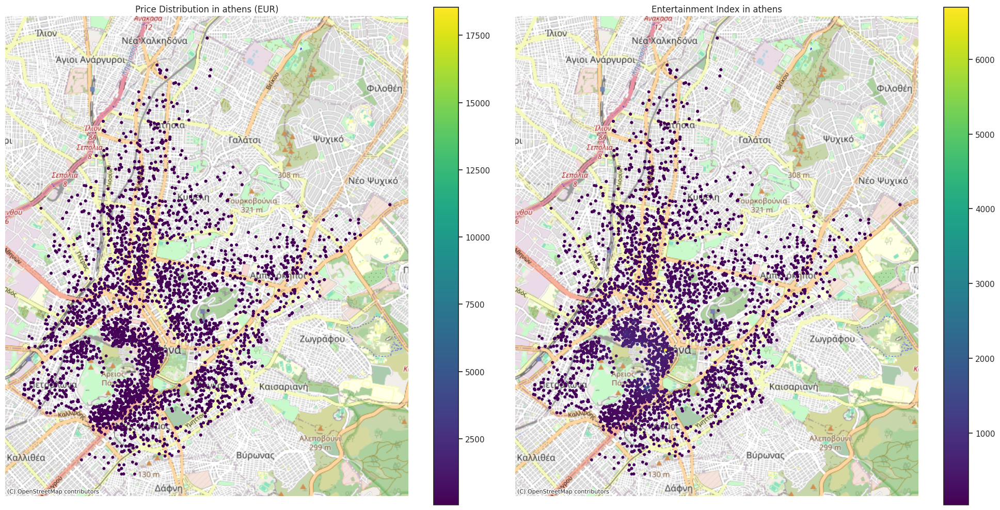

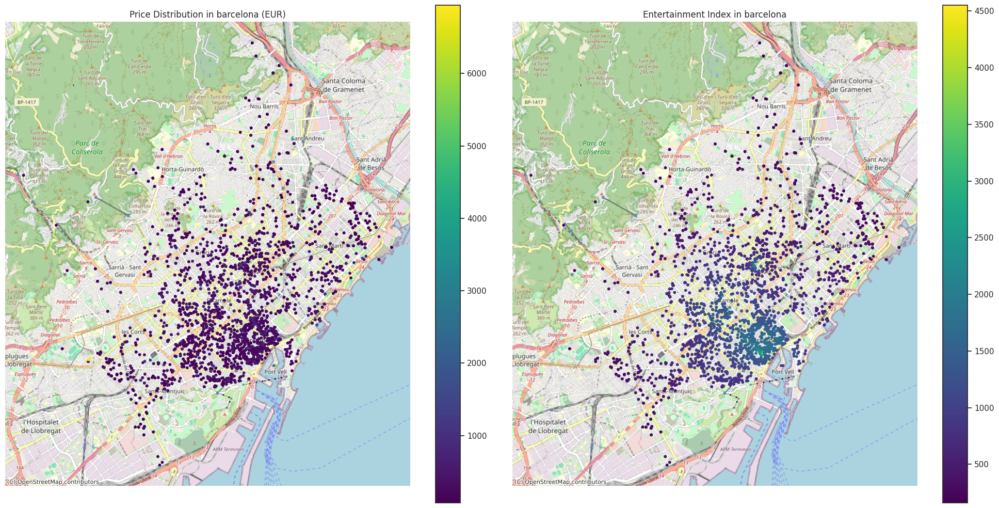

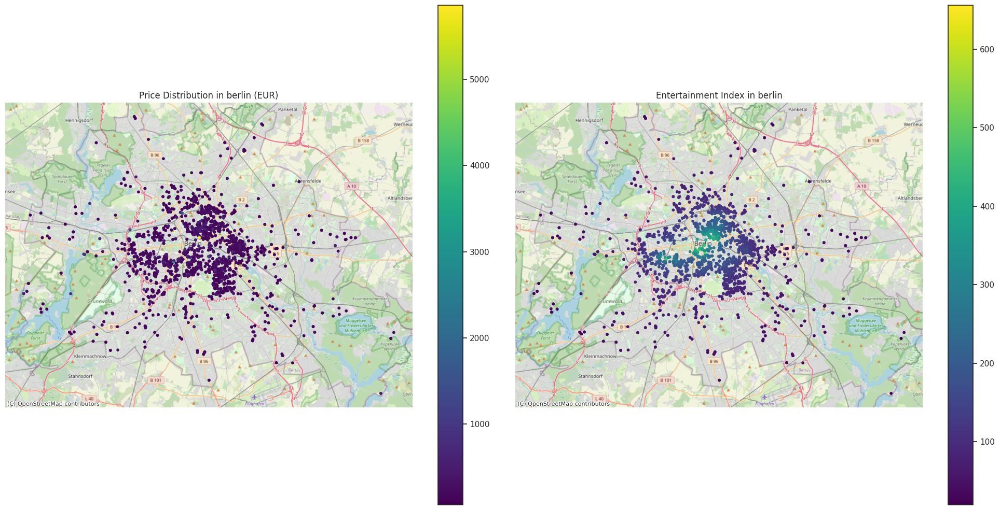

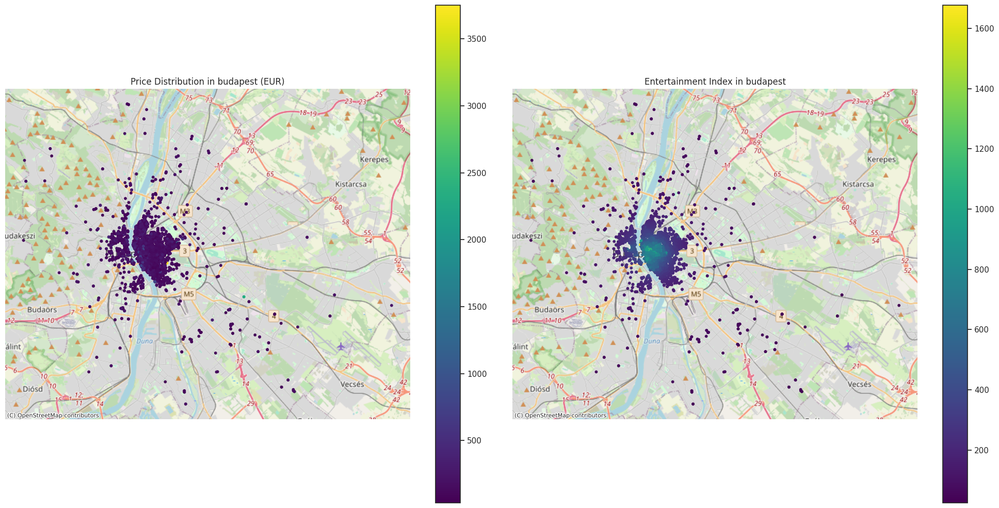

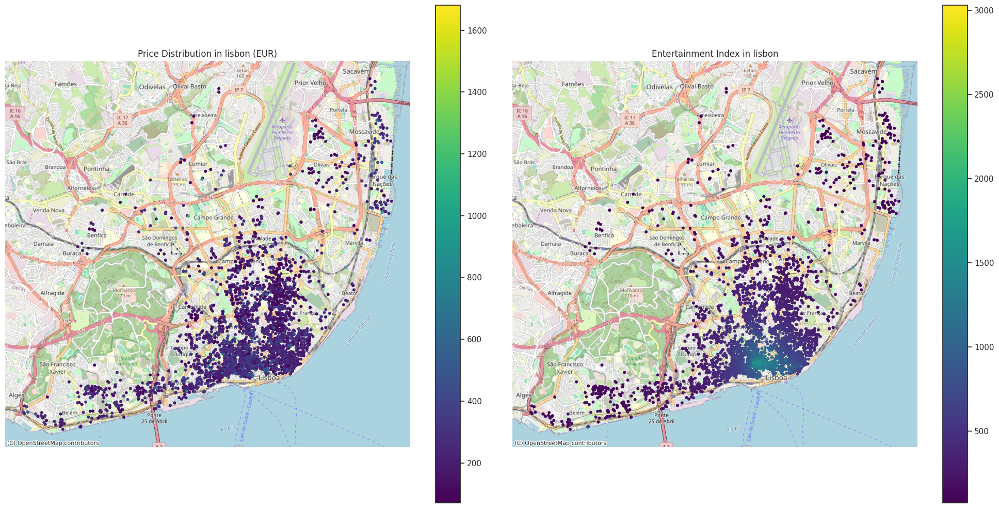

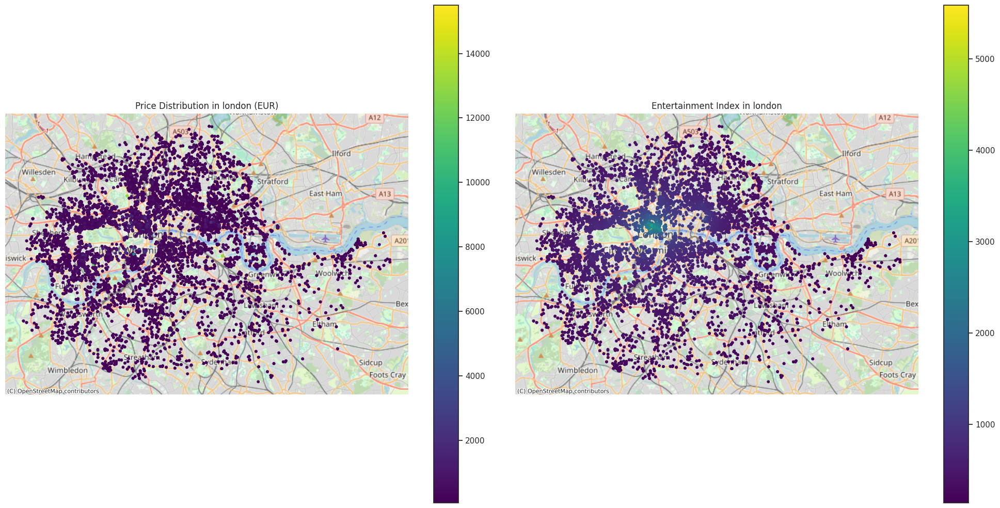

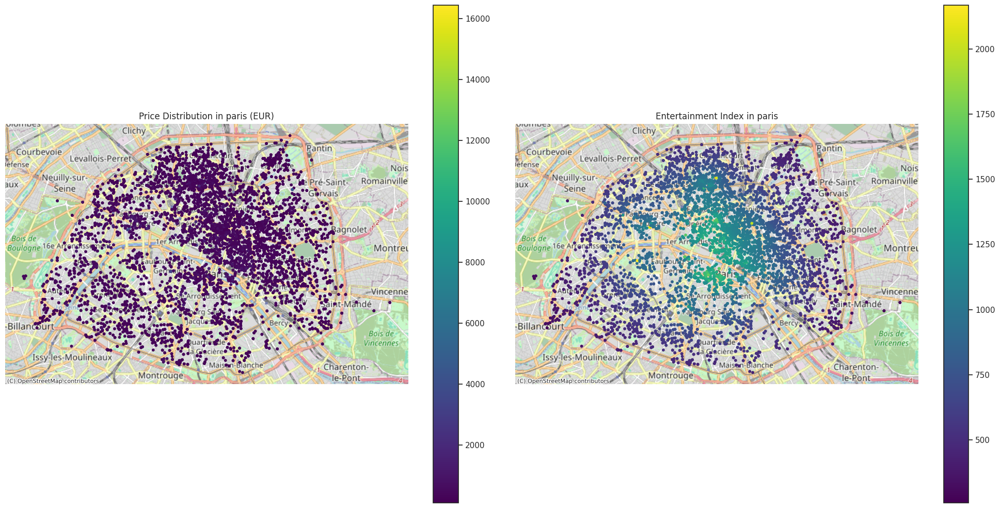

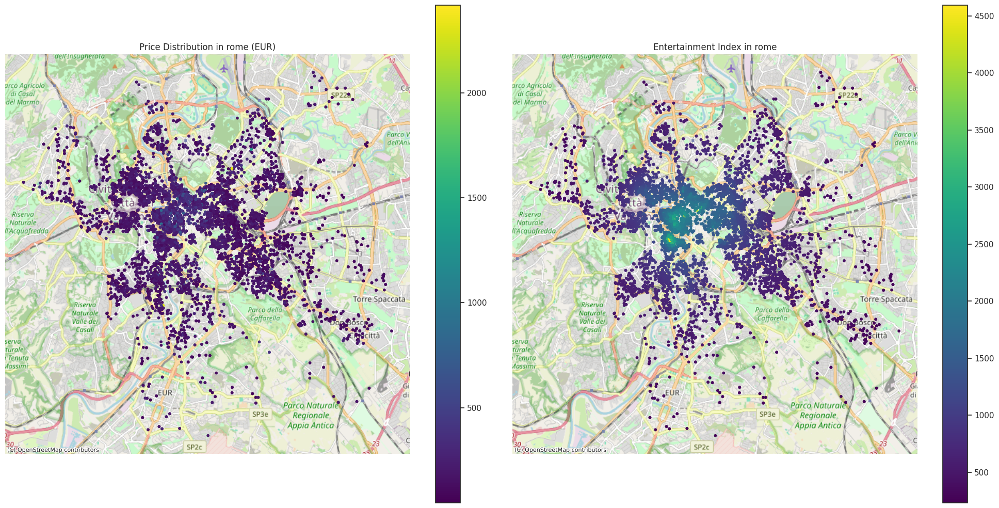

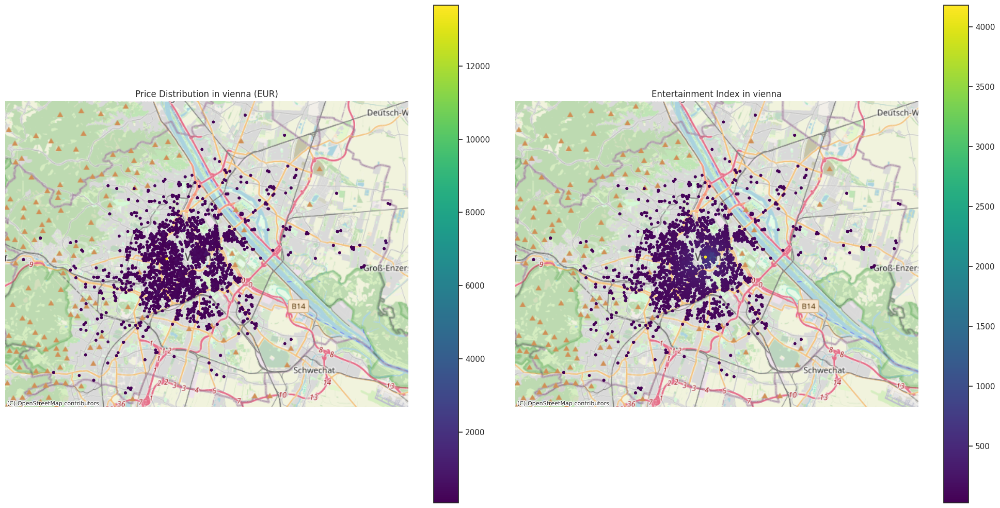

In [40]:
geometry = [Point(xy) for xy in zip(df['lng'], df['lat'])]
geo_df = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326").to_crs(epsg=3857)

geo_df['entertainment_index'] = geo_df[['attr_index', 'rest_index']].max(axis=1)

def plot_city_distribution(city):
    city_data = geo_df[geo_df['city'] == city]

    plt.figure(figsize=(20, 10))

    ax1 = plt.subplot(121)
    city_data.plot(ax=ax1, column='realSum', legend=True, cmap="viridis", markersize=10)
    ctx.add_basemap(ax1, crs=city_data.crs, source=ctx.providers.OpenStreetMap.Mapnik)
    ax1.set_title(f'Price Distribution in {city} (EUR)')
    ax1.axis("off")

    ax2 = plt.subplot(122)
    city_data.plot(ax=ax2, column='entertainment_index', legend=True, cmap="viridis", markersize=10)
    ctx.add_basemap(ax2, crs=city_data.crs, source=ctx.providers.OpenStreetMap.Mapnik)
    ax2.set_title(f'Entertainment Index in {city}')
    ax2.axis("off")

    plt.tight_layout()
    plt.show()

for city in df['city'].unique():
    plot_city_distribution(city)

In [63]:
df_weekdays = df[df['day_type'] == 'weekdays']
df_weekends = df[df['day_type'] == 'weekends']

def plot_heatmap(df, day_type, col='realSum', title="Airbnb Prices"):
    trace = go.Densitymapbox(
        lat=df["lat"],
        lon=df["lng"],
        z=df[col],
        radius=10,
        colorscale="Twilight",
        opacity=0.7,
        showscale=True,
        colorbar=dict(
            title=title,
            titleside="top",
            thickness=20,
            ticksuffix="€"
        )
    )

    mapbox_style = "carto-positron"
    center_lat = df["lat"].mean()
    center_lon = df["lng"].mean()
    layout = go.Layout(
        title=f"<b>Airbnb Prices</b> ({day_type.capitalize()})",
        titlefont=dict(size=16),
        mapbox=dict(
            style=mapbox_style,
            center=dict(lat=center_lat, lon=center_lon),
            zoom=10
        ),
        hovermode="closest",
        margin=dict(l=30, r=30, t=50, b=30)
    )

    fig = go.Figure(data=[trace], layout=layout)

    return fig

In [64]:
fig_weekdays = plot_heatmap(df_weekdays, 'weekday')
fig_weekends = plot_heatmap(df_weekends, 'weekend')

fig_weekdays.show()
fig_weekends.show()

# Data Preprocessing


Applying One Hot Encoding to the categorical features

In [42]:
preprocessed_data = pd.get_dummies(
    df,
    columns=["room_type", "multi", "biz", "city", "day_type"],
    drop_first=True
)

# Convert boolean columns to integers (1 or 0)
for col in preprocessed_data.select_dtypes(include=[bool]).columns:
    preprocessed_data[col] = preprocessed_data[col].astype(int)


,Unnamed: 0,realSum,room_shared,room_private,person_capacity,host_is_superhost,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,...,city_athens,city_barcelona,city_berlin,city_budapest,city_lisbon,city_london,city_paris,city_rome,city_vienna,day_type_weekends
0,0,194.033698,0,1,2.0,0,10.0,93.0,1,5.022964,...,0,0,0,0,0,0,0,0,0,0
1,1,344.245776,0,1,4.0,0,8.0,85.0,1,0.488389,...,0,0,0,0,0,0,0,0,0,0
2,2,264.101422,0,1,2.0,0,9.0,87.0,1,5.748312,...,0,0,0,0,0,0,0,0,0,0
3,3,433.529398,0,1,4.0,0,9.0,90.0,2,0.384862,...,0,0,0,0,0,0,0,0,0,0
4,4,485.552926,0,1,2.0,1,10.0,98.0,1,0.544738,...,0,0,0,0,0,0,0,0,0,0


Applying Log Transformation in `realSum` column to reduce the skewness and creating a new column name `price`

In [43]:
preprocessed_data['price'] = np.log(preprocessed_data['realSum'])
preprocessed_data.head()

,Unnamed: 0,realSum,room_shared,room_private,person_capacity,host_is_superhost,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,...,city_barcelona,city_berlin,city_budapest,city_lisbon,city_london,city_paris,city_rome,city_vienna,day_type_weekends,price
0,0,194.033698,0,1,2.0,0,10.0,93.0,1,5.022964,...,0,0,0,0,0,0,0,0,0,5.268032
1,1,344.245776,0,1,4.0,0,8.0,85.0,1,0.488389,...,0,0,0,0,0,0,0,0,0,5.841356
2,2,264.101422,0,1,2.0,0,9.0,87.0,1,5.748312,...,0,0,0,0,0,0,0,0,0,5.576333
3,3,433.529398,0,1,4.0,0,9.0,90.0,2,0.384862,...,0,0,0,0,0,0,0,0,0,6.071960
4,4,485.552926,0,1,2.0,1,10.0,98.0,1,0.544738,...,0,0,0,0,0,0,0,0,0,6.185288
